(2400,) (2400,) (2400,)


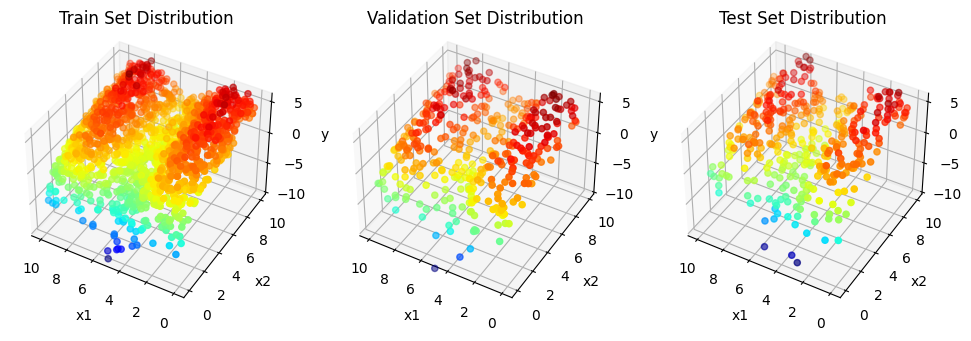

In [8]:
#x,y 데이터 3D 공간에 시각화
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

# ====== Generating Dataset ====== #
num_data = 2400
x1 = np.random.rand(num_data) * 10
x2 = np.random.rand(num_data) * 10
e = np.random.normal(0, 0.5, num_data)
X = np.array([x1, x2]).T
y = 2*np.sin(x1) + np.log(0.5*x2**2) + e
# ====== Split Dataset into Train, Validation, Test ======#
train_X, train_y = X[:1600, :], y[:1600]
val_X, val_y = X[1600:2000, :], y[1600:2000]
test_X, test_y = X[2000:, :], y[2000:]

# ====== Visualize Each Dataset ====== #
fig = plt.figure(figsize=(12,5))
ax1 = fig.add_subplot(1, 3, 1, projection='3d') #row가 1개이고 column이 3개인 그래프를 1번째 칸에데가 넣겠다.
ax1.scatter(train_X[:, 0], train_X[:, 1], train_y, c=train_y, cmap='jet')#c value에 따라 색깔을 다르게하겠다. cmap은 컬러바 종류

ax1.set_xlabel('x1')
ax1.set_ylabel('x2')
ax1.set_zlabel('y')
ax1.set_title('Train Set Distribution')
ax1.set_zlim(-10, 6) #z축의 범위
ax1.view_init(40, -60) #3d이기때문에 쓰는 옵션 보는 각도를 바꿔줌
ax1.invert_xaxis() # 오른쪽 모서리를 0 0 으로 하기 위해서

ax2 = fig.add_subplot(1, 3, 2, projection='3d')
ax2.scatter(val_X[:, 0], val_X[:, 1], val_y, c=val_y, cmap='jet')

ax2.set_xlabel('x1')
ax2.set_ylabel('x2')
ax2.set_zlabel('y')
ax2.set_title('Validation Set Distribution')
ax2.set_zlim(-10, 6)
ax2.view_init(40, -60)
ax2.invert_xaxis()

ax3 = fig.add_subplot(1, 3, 3, projection='3d')
ax3.scatter(test_X[:, 0], test_X[:, 1], test_y, c=test_y, cmap='jet')

ax3.set_xlabel('x1')
ax3.set_ylabel('x2')
ax3.set_zlabel('y')
ax3.set_title('Test Set Distribution')
ax3.set_zlim(-10, 6)
ax3.view_init(40, -60)
ax3.invert_xaxis()

print(x1.shape, x2.shape, y.shape)
plt.show()

In [2]:
import torch
print(torch.__version__)

2.0.1+cpu


Linear Regression시에 활용하는 H(x) = Wx + b 를 파이토치로 구현할 때 단순하게 nn.Linear 모듈을 하나 만들어주면 됩니다.

In [9]:
import torch
import torch.nn as nn #torch.nn.Module 은 PyTorch의 모든 Neural Network의 Base Class이다. 모듈은 다른 모듈을 포함할 수 있고, 트리 구조로 형성할 수 있다.


class LinearModel(nn.Module): #nn.moudle training 단계
    def __init__(self): 
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features=2, out_features=1, bias=True)
    
    def forward(self, x): #꼭지켜서 써줘야함 다른함수면 pytorch가 인식못함
    # 인스턴스(샘플) x가 인풋으로 들어왔을 때 모델이 예측하는 y값을 리턴합니다.
        return self.linear(x)
    
    
class MLPModel(nn.Module):
    def __init__(self,in_dim,out_dim,hid_dim): 
        super(MLPModel, self).__init__()
        self.linear1 = nn.Linear(in_features=in_dim, out_features=hid_dim)
        self.linear2 = nn.Linear(in_features=hid_dim, out_features=out_dim)
        self.relu = nn.ReLU()
    
    def forward(self, x):
    # 인스턴스(샘플) x가 인풋으로 들어왔을 때 모델이 예측하는 y값을 리턴합니다.
        x = self.linear1(x)
        x = self.relu(x)
        x = self.linear2(x)
        return x

In [10]:
lm = LinearModel()
print(lm.linear.weight) #w 행렬
print(lm.linear.bias) #bias 행렬 -> 넣은 값이 없지만 위 nn.Module 알아서 값을 넣어줌

Parameter containing:
tensor([[-0.0600,  0.4365]], requires_grad=True)
Parameter containing:
tensor([0.3404], requires_grad=True)


In [6]:
m = MLPModel(2,1,200) #만약 hidden layer 개수도 변수화 하려면 어떻게??

Regression Problem 에서의 Loss Function을 작성해봅시다.  
파이토치의 `nn` 아래에는 다양한 Loss Function이 이미 구현되어 있습니다.  
[여기](https://pytorch.org/docs/stable/_modules/torch/nn/modules/loss.html)에서 파이토치 내부에 구현되어 있는 MSE, Cross-Entropy, KL-Divergence 등을 확인할 수 있습니다.  
이 실습에서는 Regression Problem 이므로 Mean Squared Error 즉 MSE Loss를 써봅시다.

In [11]:
reg_loss = nn.MSELoss()

#uncomment for testing Loss Function 
#어떻게 loss 값을 주는지 파악할 때 아래 test실행
print(type([0,0,0,0]))
test_pred_y = torch.Tensor([0,0,0,0]) #torch의 datetype, tensor는 gradient를 지원
print(type(test_pred_y))
test_true_y = torch.Tensor([0,1,0,1])

print(reg_loss(test_pred_y, test_true_y)) #일치하지 않기 때문에 loss가 2개가 1씩 차이 나서 총 2 -> 2/4 = 0.5
print(reg_loss(test_true_y, test_true_y)) #완전 일치하기 때문에 loss가 0



<class 'list'>
<class 'torch.Tensor'>
tensor(0.5000)
tensor(0.)


이제 모델도 정의했고 Loss Function도 정의했으니 한번 학습시켜볼까요?  
저번에는 저희가 직접 파라미터(w 하나)에 따른 loss의 편미분을 유도하고 거기서 나온 그라디언트로 w를 업데이트했는데요.  
`pytorch`에서는 loss.backward() 라는 기능을 쓰면 알아서 loss를 계산되는데 사용한 각 파라미터에 대한 loss의 편미분을 계산해줍니다.  
이후 `optimizer.step()` 함수를 사용하면 각 파라미터의 그라디언트를 바탕으로 파라미터의 값을 조금씩 업데이트 해줍니다. 

이 때 모델은 매 Iteration 때마다 Train Set에 의해 학습되면서 동시에 Validation Set을 넣고 Loss를 비교하게됩니다. 
그리고 저희가 평가하고 싶은 때마다 (지금은 200번) Test Set을 넣고 Visualize 하는데 필요한 Predicted y값과 Metric 값을 계산합니다. 여기서 Metric으로는 mean absolute error(MAE)를 활용해보죵  

$$MAE(Y_{true}, Y_{predict}) = \sum_{i} | \ y_{true}^{(i)} - y_{predict}^{(i)} \ | $$

# LinearModel
## Linear 모델이기 때문에 평면밖에 인식 못함

<generator object Module.parameters at 0x000001790E3DCEB0>
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(5.7656, grad_fn=<MseLossBackward0>)


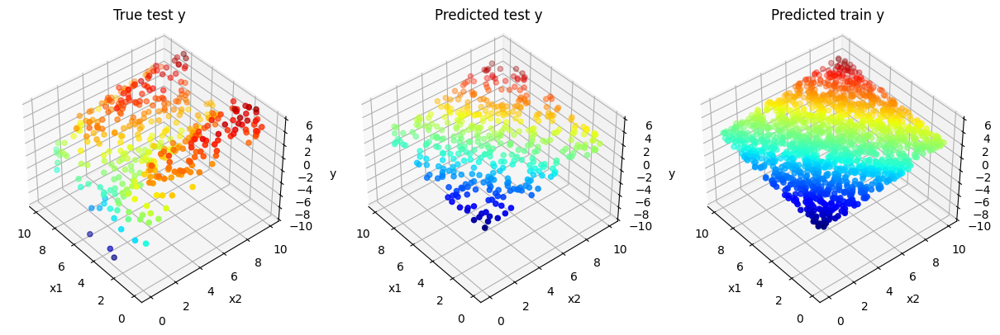

0 tensor(5.1323, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(4.3998, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(3.9822, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(3.7628, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(3.6027, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(3.4729, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(3.3650, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(3.2749, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(3.1996, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(3.1366, grad_fn=<MseLossBackward0>)
t

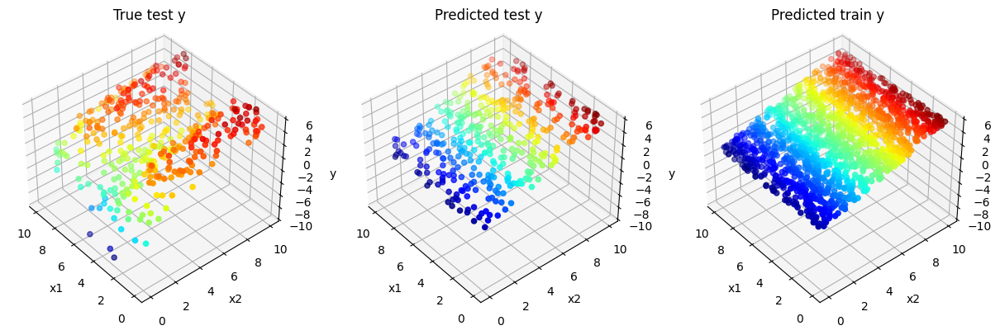

200 tensor(3.2680, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)

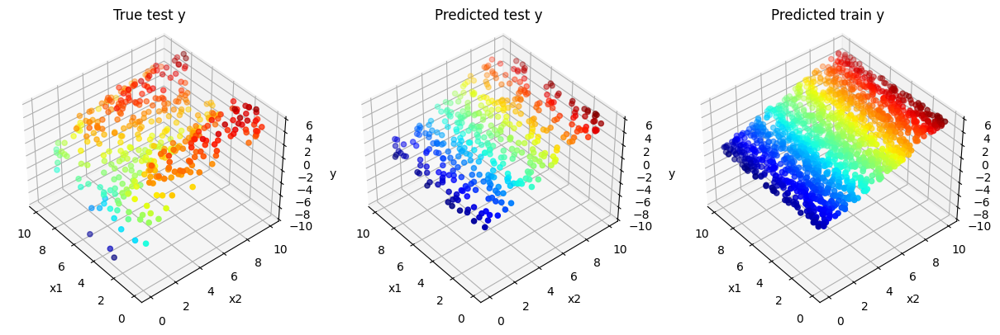

400 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)

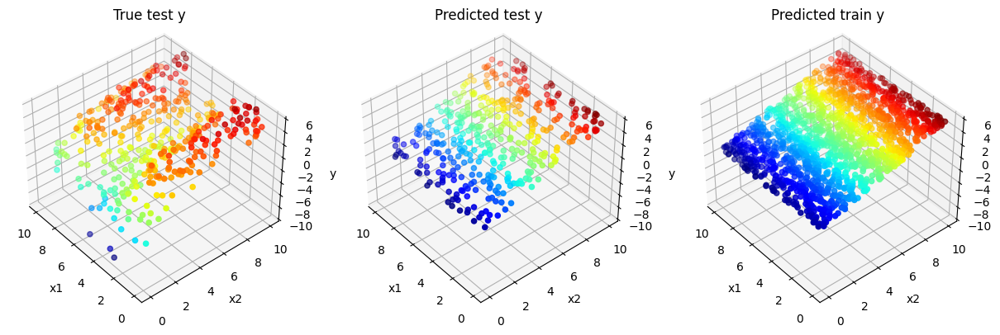

600 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)

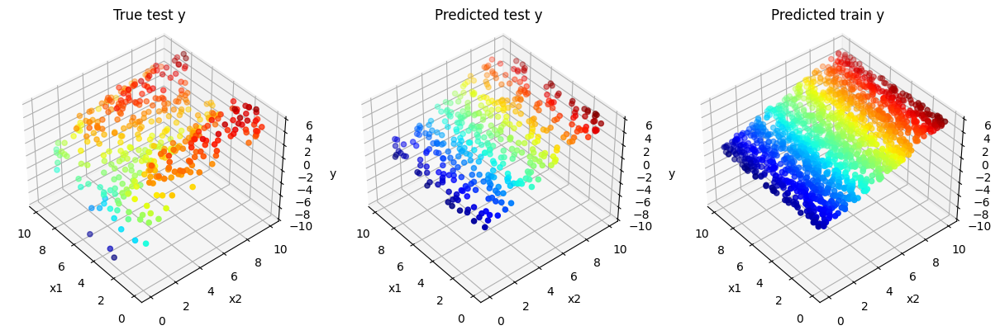

800 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)

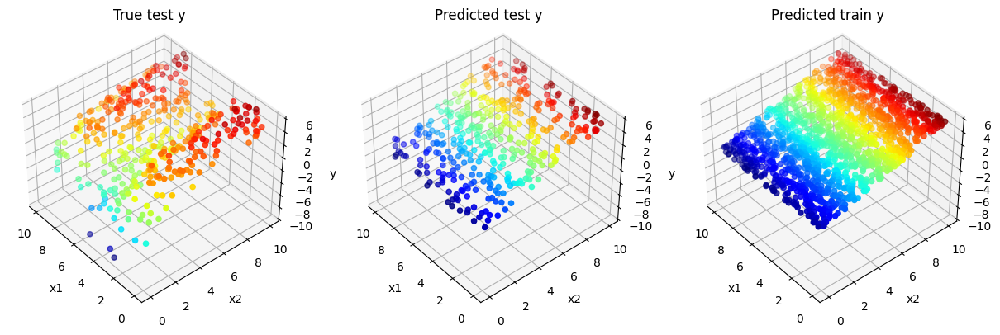

1000 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

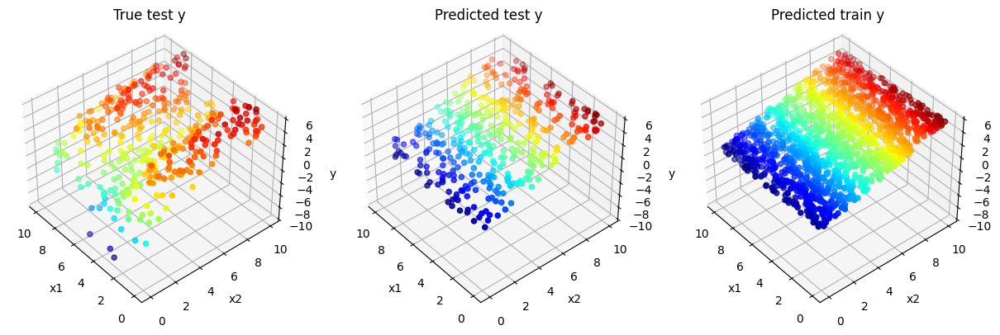

1200 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

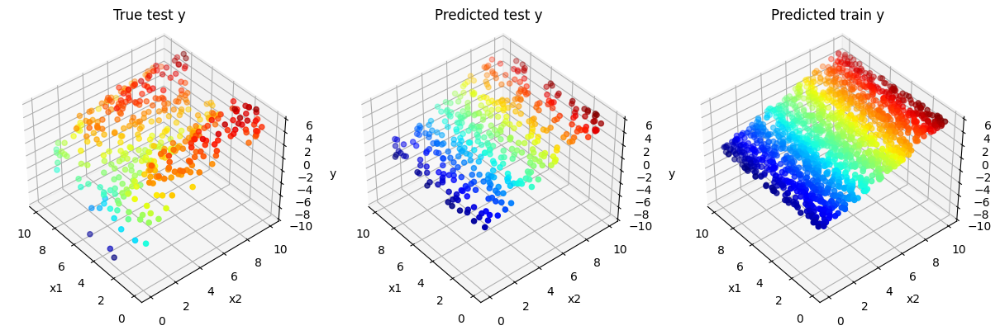

1400 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

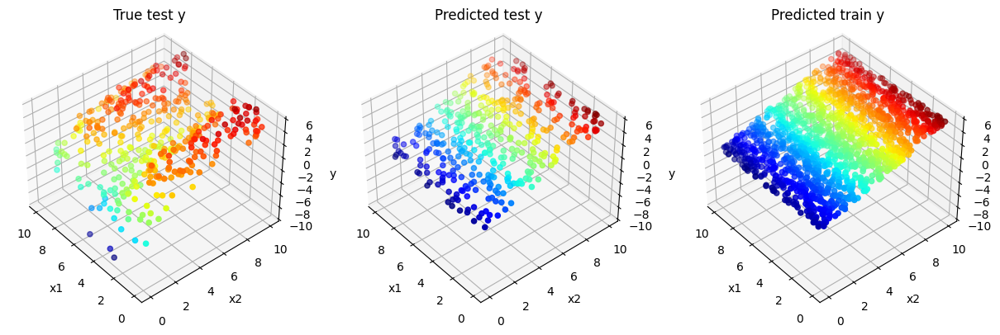

1600 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

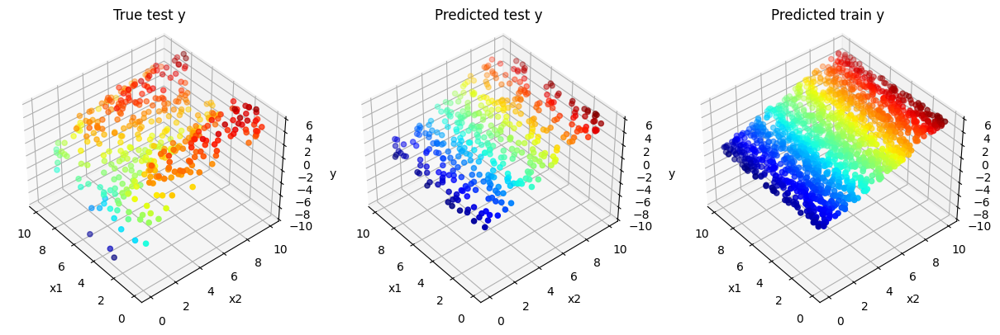

1800 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

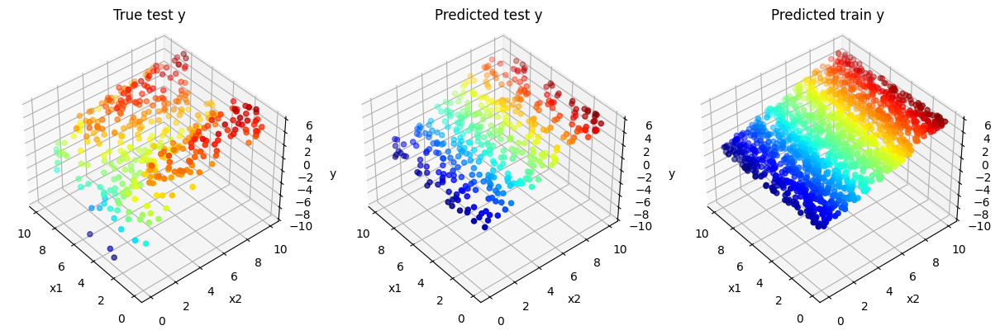

2000 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

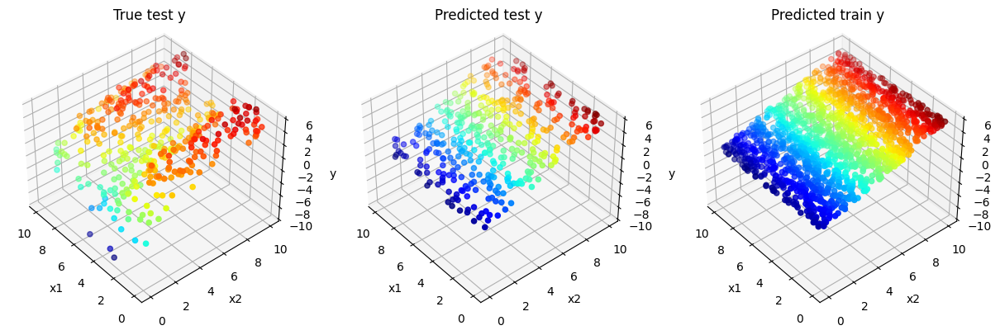

2200 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

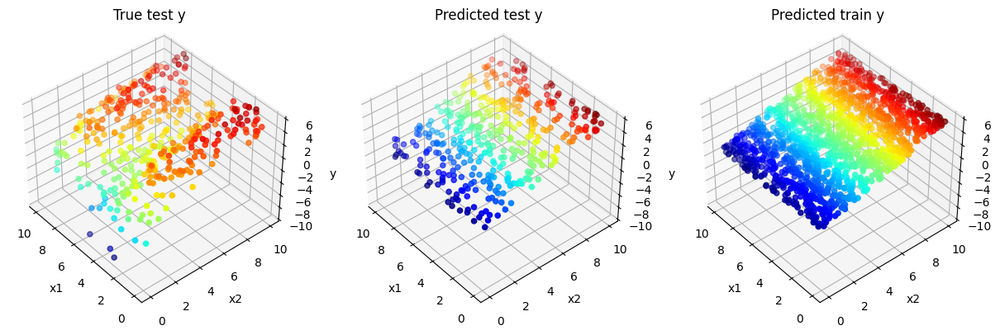

2400 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

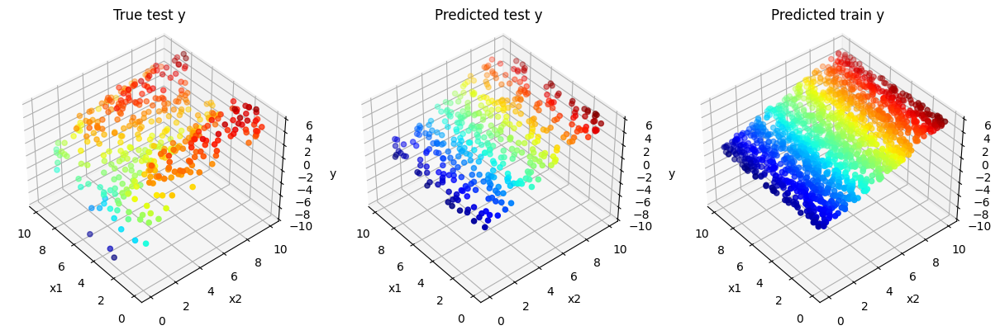

2600 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

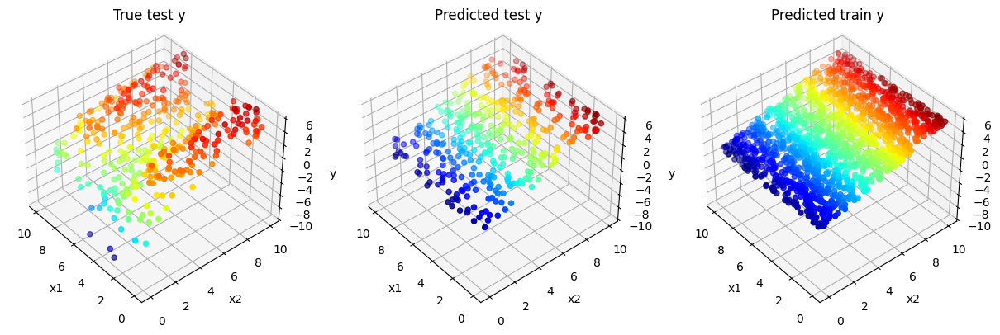

2800 tensor(3.2681, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

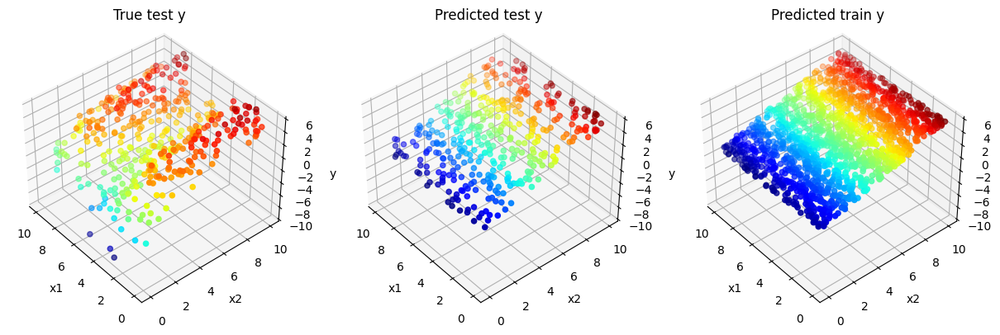

3000 tensor(3.2682, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

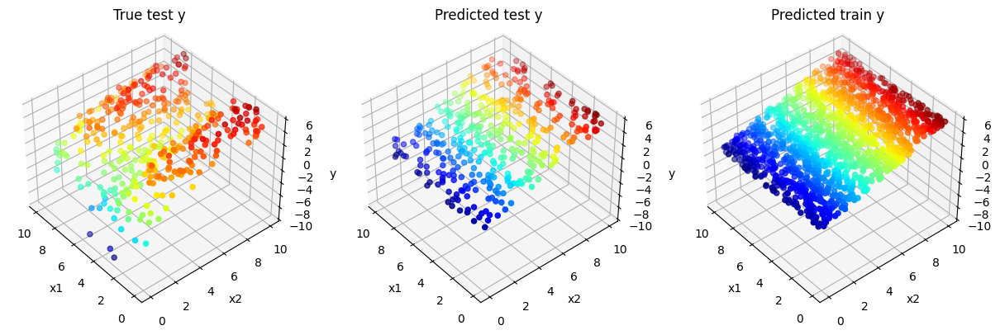

3200 tensor(3.2682, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

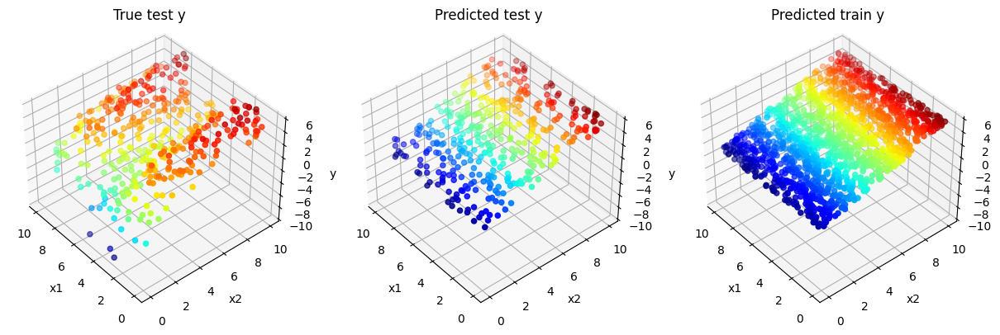

3400 tensor(3.2682, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

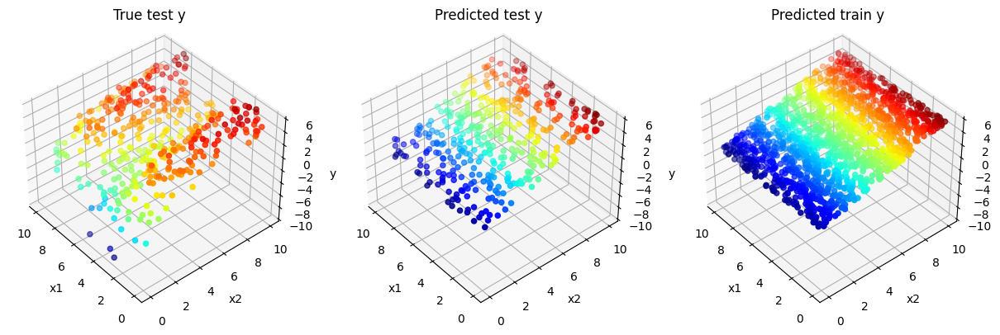

3600 tensor(3.2682, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

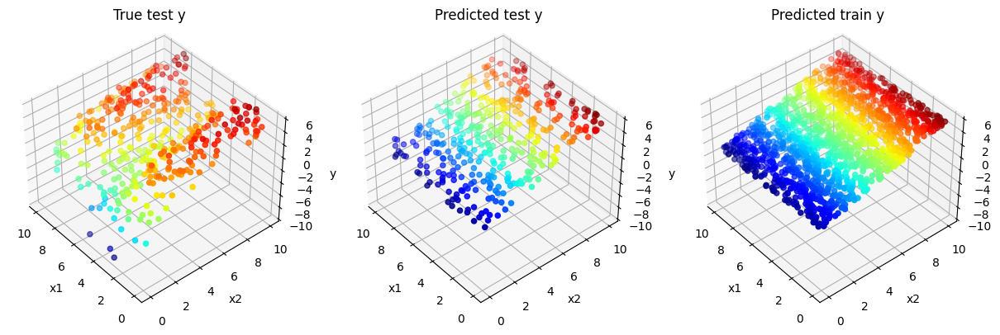

3800 tensor(3.2682, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>)
torch.Size([1600, 2]) torch.Size([1600]) torch.Size([1600, 1])
tensor(2.8142, grad_fn=<MseLossBackward0>

In [12]:
import torch.optim as optim
from sklearn.metrics import mean_absolute_error


# ====== Construct Model ====== #
model = LinearModel()
# print(model.linear.weight)
# print(model.linear.bias)

#model = MLPModel() # Model을 생성해줍니다.
#print('{} parameters'.format(sum(p.numel() for p in model.parameters() if p.requires_grad))) # 복잡해보이지만 간단히 모델 내에 학습을 당할 파라미터 수를 카운팅하는 코드입니다.

# ===== Construct Optimizer ====== #
lr = 0.005 # Learning Rate를 하나 정해줍니다. (원할한 학습을 위해 손을 많이 탑니다)
optimizer = optim.SGD(model.parameters(), lr=lr) # Optimizer를 생성해줍니다.model.parameters()로 w와 b를 optimizer에게 전달 

print(model.parameters())
#SGD : Stochastic Gradient Descent
#adam , rmsprop , adadelta etc

# 매 학습 단계에서의 epoch값과 그 때의 loss 값을 저장할 리스트를 만들어줍시다.
list_epoch = [] 
list_train_loss = []
list_val_loss = []
list_mae = []
list_mae_epoch = []


epoch = 4000 # 학습 횟수(epoch)을 지정해줍시다. 
#iteration과 혼동 X iteration : parameter가 한번 업데이트 되는 것을 말함
#만약 data가 10만개 만개 씩 chunk 하면(chunk를 batch 혹은 mini batch 라고함) batch 한번으로 gradient를 업데이트하는데 이때 1 iteration 한 것 이때 각 batch를 모두 수행하면 즉 10 iteration을 하면 이게 1 epoch

for i in range(epoch):
    
    # ====== Train ====== #
    model.train() # model을 train 모드로 세팅합니다. 반대로 향후 모델을 평가할 때는 eval() 모드로 변경할 겁니다 (나중 실습에서 쓸 겁니다)
    optimizer.zero_grad() # optimizer에 남아있을 수도 있는 잔여 그라디언트를 0으로 다 초기화해줍니다. 반복문 상 한번 train할 때 남은 gradient가 중첩하는 것을 방지
    
    #train_X 와 train_Y는 각각 numpy로 이를 tensor로 바꿔줌
    input_x = torch.Tensor(train_X)
    true_y = torch.Tensor(train_y)
    pred_y = model(input_x)
    print(input_x.shape, true_y.shape, pred_y.shape) # 각 인풋과 아웃풋의 차원을 체크해봅니다.
    

    #print(pred_y.shape,pred_y.squeeze().shape)
    loss = reg_loss(pred_y.squeeze(), true_y) #pred_y의 shape은 1600 X 1 즉 2차원으로 되어있음 loss는 1600을 원하기 때문에 2차원을 1차원리스트로 바꿈
    print(loss)

    loss.backward() # backward()를 통해서 그라디언트를 구해줍니다.
    optimizer.step() # step()을 통해서 그라디언트를 바탕으로 파라미터를 업데이트 해줍니다. 
    list_epoch.append(i)
    #list_train_loss.append(loss.detach().numpy()) #위에 loss에 backward를 해줬기 때문에 gradient가 loss에 존재하기때문에 gradient를 제외하고 loss만 출력하고자 detach() 사용 , 해당 type이 tensor 이기 때문에 numpy() 로 바꿈
    list_train_loss.append(loss.item()) #loss.item하면 위 말한 과정이 한번에

    
    
    # ====== Validation ====== #
    model.eval() #evaluation 모드로 바꿔줌
    optimizer.zero_grad()
    input_x = torch.Tensor(val_X)
    true_y = torch.Tensor(val_y)
    pred_y = model(input_x)   
    loss = reg_loss(pred_y.squeeze(), true_y)
    list_val_loss.append(loss.detach().numpy())
    

    # ====== Evaluation ======= #
    if i % 200 == 0: # 200회의 학습마다 실제 데이터 분포와 모델이 예측한 분포를 그려봅니다.
        
        # ====== Calculate MAE ====== #
        model.eval()
        optimizer.zero_grad()
        input_x = torch.Tensor(test_X)
        true_y = torch.Tensor(test_y)
        pred_y = model(input_x).detach().numpy() 
        mae = mean_absolute_error(true_y, pred_y) # sklearn 쪽 함수들은 true_y 가 먼저, pred_y가 나중에 인자로 들어가는 것에 주의합시다
        list_mae.append(mae)
        list_mae_epoch.append(i)
        
        fig = plt.figure(figsize=(15,5))
        
        # ====== True Y Scattering ====== #
        ax1 = fig.add_subplot(1, 3, 1, projection='3d')
        ax1.scatter(test_X[:, 0], test_X[:, 1], test_y, c=test_y, cmap='jet')
        
        ax1.set_xlabel('x1')
        ax1.set_ylabel('x2')
        ax1.set_zlabel('y')
        ax1.set_zlim(-10, 6)
        ax1.view_init(40, -40)
        ax1.set_title('True test y')
        ax1.invert_xaxis()

        # ====== Predicted Y Scattering ====== #
        ax2 = fig.add_subplot(1, 3, 2, projection='3d')
        ax2.scatter(test_X[:, 0], test_X[:, 1], pred_y, c=pred_y[:,0], cmap='jet')

        ax2.set_xlabel('x1')
        ax2.set_ylabel('x2')
        ax2.set_zlabel('y')
        ax2.set_zlim(-10, 6)
        ax2.view_init(40, -40)
        ax2.set_title('Predicted test y')
        ax2.invert_xaxis()

        # ====== Just for Visualizaing with High Resolution ====== #
        input_x = torch.Tensor(train_X)
        pred_y = model(input_x).detach().numpy() 
        
        ax3 = fig.add_subplot(1, 3, 3, projection='3d')
        ax3.scatter(train_X[:, 0], train_X[:, 1], pred_y, c=pred_y[:,0], cmap='jet')

        ax3.set_xlabel('x1')
        ax3.set_ylabel('x2')
        ax3.set_zlabel('y')
        ax3.set_zlim(-10, 6)
        ax3.view_init(40, -40)
        ax3.set_title('Predicted train y')
        ax3.invert_xaxis()
        
        plt.show()
        print(i, loss)

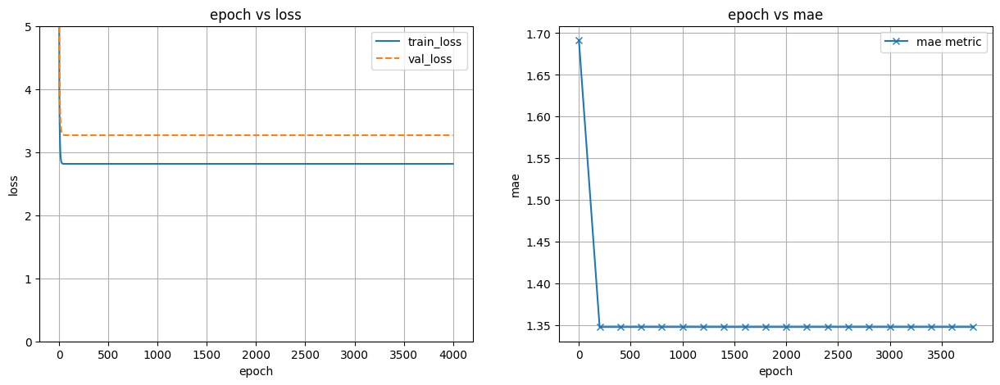

In [13]:
#loss를 저장해서 해당 과정이 어떻게 진행했는지 확인하는 절차 꼭해줘야함!!!


fig = plt.figure(figsize=(15,5))

# ====== Loss Fluctuation ====== #
ax1 = fig.add_subplot(1, 2, 1)
ax1.plot(list_epoch, list_train_loss, label='train_loss')
ax1.plot(list_epoch, list_val_loss, '--', label='val_loss')
ax1.set_xlabel('epoch')
ax1.set_ylabel('loss')
ax1.set_ylim(0, 5)
ax1.grid()
ax1.legend()
ax1.set_title('epoch vs loss')

# ====== Metric Fluctuation ====== #
ax2 = fig.add_subplot(1, 2, 2)
ax2.plot(list_mae_epoch, list_mae, marker='x', label='mae metric')

ax2.set_xlabel('epoch')
ax2.set_ylabel('mae')
ax2.grid()
ax2.legend()
ax2.set_title('epoch vs mae')


plt.show()

# MLP MODEL

tensor(13.5368, grad_fn=<MseLossBackward0>)


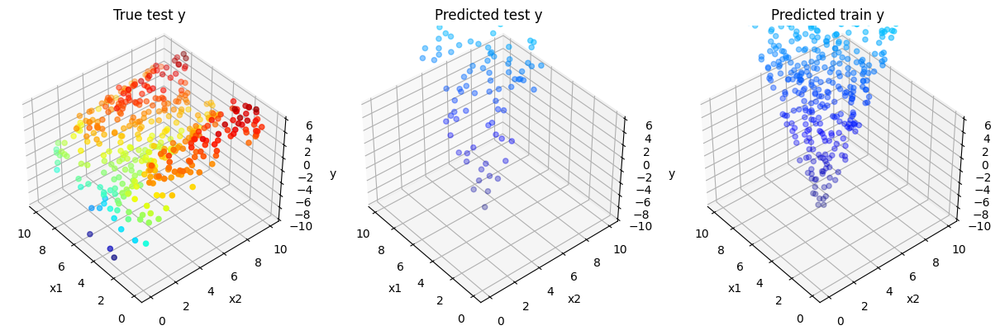

0 tensor(1101.3219, grad_fn=<MseLossBackward0>)
tensor(1129.7450, grad_fn=<MseLossBackward0>)
tensor(25976.5391, grad_fn=<MseLossBackward0>)
tensor(6.6654, grad_fn=<MseLossBackward0>)
tensor(6.5583, grad_fn=<MseLossBackward0>)
tensor(6.4530, grad_fn=<MseLossBackward0>)
tensor(6.3500, grad_fn=<MseLossBackward0>)
tensor(6.2498, grad_fn=<MseLossBackward0>)
tensor(6.1521, grad_fn=<MseLossBackward0>)
tensor(6.0567, grad_fn=<MseLossBackward0>)
tensor(5.9641, grad_fn=<MseLossBackward0>)
tensor(5.8736, grad_fn=<MseLossBackward0>)
tensor(5.7863, grad_fn=<MseLossBackward0>)
tensor(5.7027, grad_fn=<MseLossBackward0>)
tensor(5.6236, grad_fn=<MseLossBackward0>)
tensor(5.5490, grad_fn=<MseLossBackward0>)
tensor(5.4781, grad_fn=<MseLossBackward0>)
tensor(5.4112, grad_fn=<MseLossBackward0>)
tensor(5.3488, grad_fn=<MseLossBackward0>)
tensor(5.2907, grad_fn=<MseLossBackward0>)
tensor(5.2376, grad_fn=<MseLossBackward0>)
tensor(5.1889, grad_fn=<MseLossBackward0>)
tensor(5.1442, grad_fn=<MseLossBackward0>)

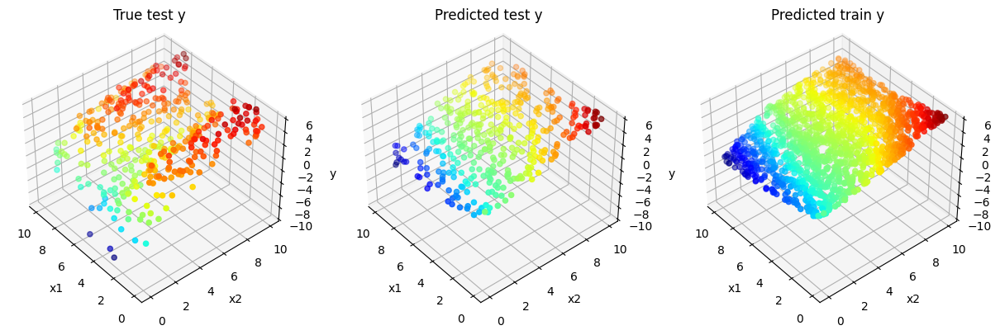

200 tensor(2.9785, grad_fn=<MseLossBackward0>)
tensor(2.5754, grad_fn=<MseLossBackward0>)
tensor(2.5735, grad_fn=<MseLossBackward0>)
tensor(2.5716, grad_fn=<MseLossBackward0>)
tensor(2.5697, grad_fn=<MseLossBackward0>)
tensor(2.5678, grad_fn=<MseLossBackward0>)
tensor(2.5660, grad_fn=<MseLossBackward0>)
tensor(2.5642, grad_fn=<MseLossBackward0>)
tensor(2.5624, grad_fn=<MseLossBackward0>)
tensor(2.5606, grad_fn=<MseLossBackward0>)
tensor(2.5588, grad_fn=<MseLossBackward0>)
tensor(2.5570, grad_fn=<MseLossBackward0>)
tensor(2.5553, grad_fn=<MseLossBackward0>)
tensor(2.5535, grad_fn=<MseLossBackward0>)
tensor(2.5518, grad_fn=<MseLossBackward0>)
tensor(2.5501, grad_fn=<MseLossBackward0>)
tensor(2.5485, grad_fn=<MseLossBackward0>)
tensor(2.5468, grad_fn=<MseLossBackward0>)
tensor(2.5452, grad_fn=<MseLossBackward0>)
tensor(2.5436, grad_fn=<MseLossBackward0>)
tensor(2.5420, grad_fn=<MseLossBackward0>)
tensor(2.5404, grad_fn=<MseLossBackward0>)
tensor(2.5388, grad_fn=<MseLossBackward0>)
tensor(

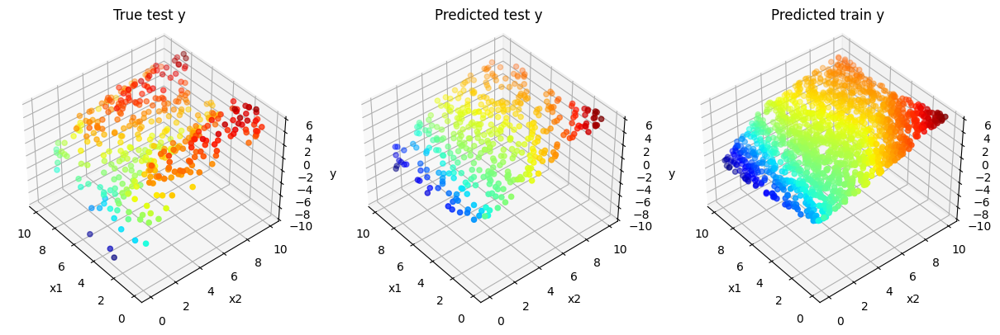

400 tensor(2.6352, grad_fn=<MseLossBackward0>)
tensor(2.3282, grad_fn=<MseLossBackward0>)
tensor(2.3273, grad_fn=<MseLossBackward0>)
tensor(2.3264, grad_fn=<MseLossBackward0>)
tensor(2.3255, grad_fn=<MseLossBackward0>)
tensor(2.3246, grad_fn=<MseLossBackward0>)
tensor(2.3237, grad_fn=<MseLossBackward0>)
tensor(2.3228, grad_fn=<MseLossBackward0>)
tensor(2.3219, grad_fn=<MseLossBackward0>)
tensor(2.3211, grad_fn=<MseLossBackward0>)
tensor(2.3202, grad_fn=<MseLossBackward0>)
tensor(2.3193, grad_fn=<MseLossBackward0>)
tensor(2.3185, grad_fn=<MseLossBackward0>)
tensor(2.3176, grad_fn=<MseLossBackward0>)
tensor(2.3167, grad_fn=<MseLossBackward0>)
tensor(2.3159, grad_fn=<MseLossBackward0>)
tensor(2.3150, grad_fn=<MseLossBackward0>)
tensor(2.3141, grad_fn=<MseLossBackward0>)
tensor(2.3133, grad_fn=<MseLossBackward0>)
tensor(2.3124, grad_fn=<MseLossBackward0>)
tensor(2.3115, grad_fn=<MseLossBackward0>)
tensor(2.3107, grad_fn=<MseLossBackward0>)
tensor(2.3098, grad_fn=<MseLossBackward0>)
tensor(

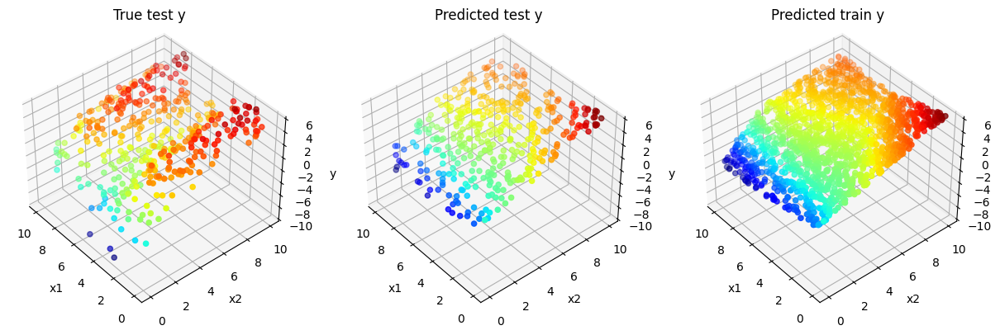

600 tensor(2.4338, grad_fn=<MseLossBackward0>)
tensor(2.1799, grad_fn=<MseLossBackward0>)
tensor(2.1793, grad_fn=<MseLossBackward0>)
tensor(2.1787, grad_fn=<MseLossBackward0>)
tensor(2.1781, grad_fn=<MseLossBackward0>)
tensor(2.1775, grad_fn=<MseLossBackward0>)
tensor(2.1769, grad_fn=<MseLossBackward0>)
tensor(2.1763, grad_fn=<MseLossBackward0>)
tensor(2.1757, grad_fn=<MseLossBackward0>)
tensor(2.1751, grad_fn=<MseLossBackward0>)
tensor(2.1745, grad_fn=<MseLossBackward0>)
tensor(2.1739, grad_fn=<MseLossBackward0>)
tensor(2.1732, grad_fn=<MseLossBackward0>)
tensor(2.1726, grad_fn=<MseLossBackward0>)
tensor(2.1720, grad_fn=<MseLossBackward0>)
tensor(2.1714, grad_fn=<MseLossBackward0>)
tensor(2.1708, grad_fn=<MseLossBackward0>)
tensor(2.1702, grad_fn=<MseLossBackward0>)
tensor(2.1696, grad_fn=<MseLossBackward0>)
tensor(2.1690, grad_fn=<MseLossBackward0>)
tensor(2.1684, grad_fn=<MseLossBackward0>)
tensor(2.1678, grad_fn=<MseLossBackward0>)
tensor(2.1672, grad_fn=<MseLossBackward0>)
tensor(

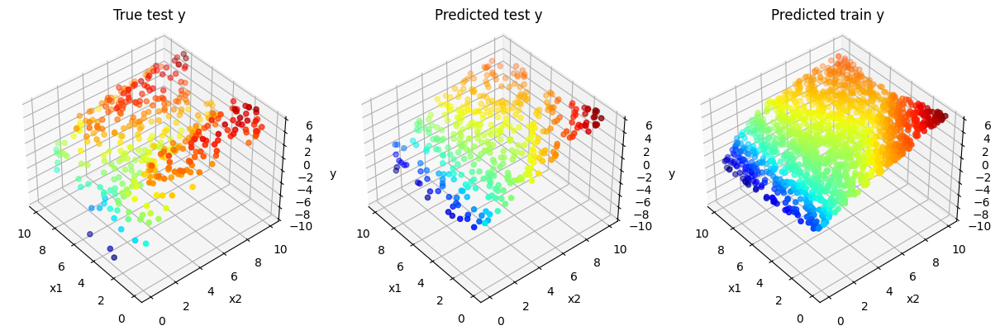

800 tensor(2.2828, grad_fn=<MseLossBackward0>)
tensor(2.0697, grad_fn=<MseLossBackward0>)
tensor(2.0693, grad_fn=<MseLossBackward0>)
tensor(2.0688, grad_fn=<MseLossBackward0>)
tensor(2.0683, grad_fn=<MseLossBackward0>)
tensor(2.0678, grad_fn=<MseLossBackward0>)
tensor(2.0673, grad_fn=<MseLossBackward0>)
tensor(2.0669, grad_fn=<MseLossBackward0>)
tensor(2.0664, grad_fn=<MseLossBackward0>)
tensor(2.0659, grad_fn=<MseLossBackward0>)
tensor(2.0655, grad_fn=<MseLossBackward0>)
tensor(2.0650, grad_fn=<MseLossBackward0>)
tensor(2.0645, grad_fn=<MseLossBackward0>)
tensor(2.0640, grad_fn=<MseLossBackward0>)
tensor(2.0636, grad_fn=<MseLossBackward0>)
tensor(2.0631, grad_fn=<MseLossBackward0>)
tensor(2.0626, grad_fn=<MseLossBackward0>)
tensor(2.0622, grad_fn=<MseLossBackward0>)
tensor(2.0617, grad_fn=<MseLossBackward0>)
tensor(2.0613, grad_fn=<MseLossBackward0>)
tensor(2.0608, grad_fn=<MseLossBackward0>)
tensor(2.0603, grad_fn=<MseLossBackward0>)
tensor(2.0599, grad_fn=<MseLossBackward0>)
tensor(

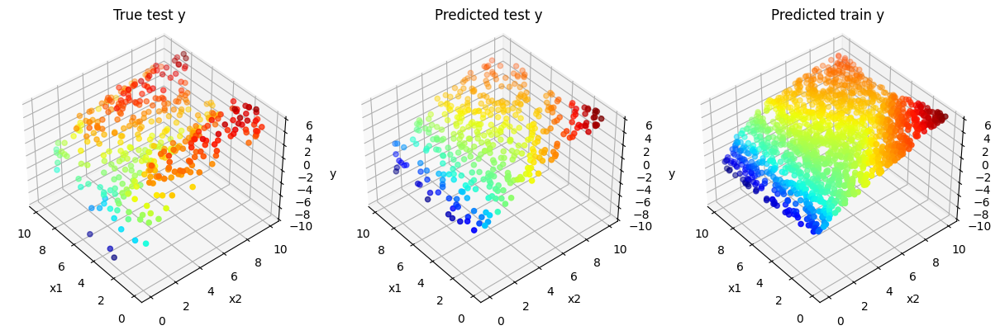

1000 tensor(2.1790, grad_fn=<MseLossBackward0>)
tensor(1.9856, grad_fn=<MseLossBackward0>)
tensor(1.9852, grad_fn=<MseLossBackward0>)
tensor(1.9848, grad_fn=<MseLossBackward0>)
tensor(1.9845, grad_fn=<MseLossBackward0>)
tensor(1.9841, grad_fn=<MseLossBackward0>)
tensor(1.9837, grad_fn=<MseLossBackward0>)
tensor(1.9833, grad_fn=<MseLossBackward0>)
tensor(1.9830, grad_fn=<MseLossBackward0>)
tensor(1.9826, grad_fn=<MseLossBackward0>)
tensor(1.9822, grad_fn=<MseLossBackward0>)
tensor(1.9819, grad_fn=<MseLossBackward0>)
tensor(1.9815, grad_fn=<MseLossBackward0>)
tensor(1.9811, grad_fn=<MseLossBackward0>)
tensor(1.9808, grad_fn=<MseLossBackward0>)
tensor(1.9804, grad_fn=<MseLossBackward0>)
tensor(1.9800, grad_fn=<MseLossBackward0>)
tensor(1.9797, grad_fn=<MseLossBackward0>)
tensor(1.9793, grad_fn=<MseLossBackward0>)
tensor(1.9789, grad_fn=<MseLossBackward0>)
tensor(1.9786, grad_fn=<MseLossBackward0>)
tensor(1.9782, grad_fn=<MseLossBackward0>)
tensor(1.9779, grad_fn=<MseLossBackward0>)
tensor

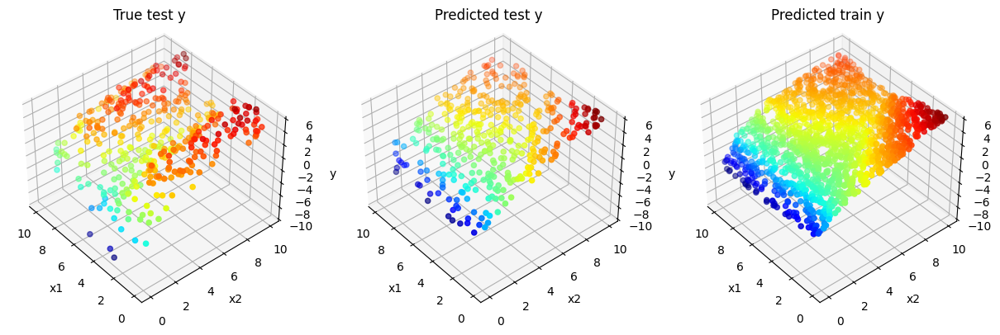

1200 tensor(2.0970, grad_fn=<MseLossBackward0>)
tensor(1.9149, grad_fn=<MseLossBackward0>)
tensor(1.9146, grad_fn=<MseLossBackward0>)
tensor(1.9142, grad_fn=<MseLossBackward0>)
tensor(1.9139, grad_fn=<MseLossBackward0>)
tensor(1.9136, grad_fn=<MseLossBackward0>)
tensor(1.9132, grad_fn=<MseLossBackward0>)
tensor(1.9129, grad_fn=<MseLossBackward0>)
tensor(1.9126, grad_fn=<MseLossBackward0>)
tensor(1.9122, grad_fn=<MseLossBackward0>)
tensor(1.9119, grad_fn=<MseLossBackward0>)
tensor(1.9116, grad_fn=<MseLossBackward0>)
tensor(1.9113, grad_fn=<MseLossBackward0>)
tensor(1.9109, grad_fn=<MseLossBackward0>)
tensor(1.9106, grad_fn=<MseLossBackward0>)
tensor(1.9103, grad_fn=<MseLossBackward0>)
tensor(1.9099, grad_fn=<MseLossBackward0>)
tensor(1.9096, grad_fn=<MseLossBackward0>)
tensor(1.9093, grad_fn=<MseLossBackward0>)
tensor(1.9090, grad_fn=<MseLossBackward0>)
tensor(1.9086, grad_fn=<MseLossBackward0>)
tensor(1.9083, grad_fn=<MseLossBackward0>)
tensor(1.9080, grad_fn=<MseLossBackward0>)
tensor

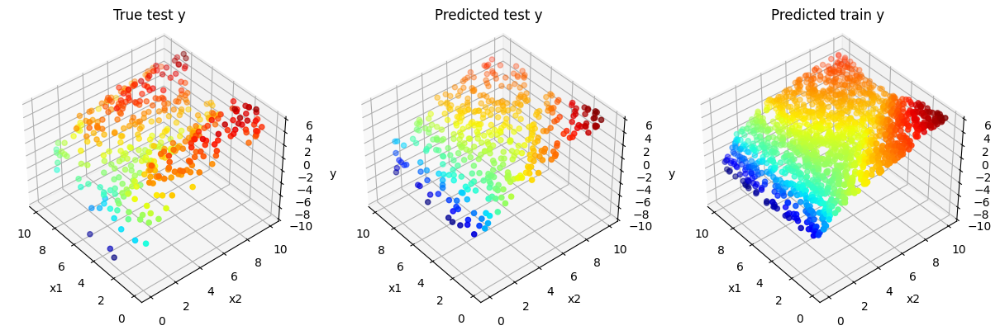

1400 tensor(2.0237, grad_fn=<MseLossBackward0>)
tensor(1.8508, grad_fn=<MseLossBackward0>)
tensor(1.8505, grad_fn=<MseLossBackward0>)
tensor(1.8502, grad_fn=<MseLossBackward0>)
tensor(1.8498, grad_fn=<MseLossBackward0>)
tensor(1.8495, grad_fn=<MseLossBackward0>)
tensor(1.8492, grad_fn=<MseLossBackward0>)
tensor(1.8489, grad_fn=<MseLossBackward0>)
tensor(1.8486, grad_fn=<MseLossBackward0>)
tensor(1.8483, grad_fn=<MseLossBackward0>)
tensor(1.8480, grad_fn=<MseLossBackward0>)
tensor(1.8476, grad_fn=<MseLossBackward0>)
tensor(1.8473, grad_fn=<MseLossBackward0>)
tensor(1.8470, grad_fn=<MseLossBackward0>)
tensor(1.8467, grad_fn=<MseLossBackward0>)
tensor(1.8464, grad_fn=<MseLossBackward0>)
tensor(1.8461, grad_fn=<MseLossBackward0>)
tensor(1.8457, grad_fn=<MseLossBackward0>)
tensor(1.8454, grad_fn=<MseLossBackward0>)
tensor(1.8451, grad_fn=<MseLossBackward0>)
tensor(1.8448, grad_fn=<MseLossBackward0>)
tensor(1.8445, grad_fn=<MseLossBackward0>)
tensor(1.8442, grad_fn=<MseLossBackward0>)
tensor

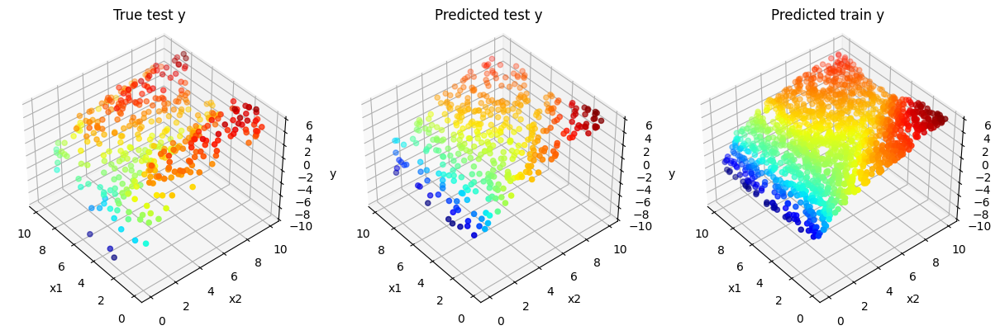

1600 tensor(1.9501, grad_fn=<MseLossBackward0>)
tensor(1.7869, grad_fn=<MseLossBackward0>)
tensor(1.7866, grad_fn=<MseLossBackward0>)
tensor(1.7863, grad_fn=<MseLossBackward0>)
tensor(1.7859, grad_fn=<MseLossBackward0>)
tensor(1.7856, grad_fn=<MseLossBackward0>)
tensor(1.7853, grad_fn=<MseLossBackward0>)
tensor(1.7850, grad_fn=<MseLossBackward0>)
tensor(1.7846, grad_fn=<MseLossBackward0>)
tensor(1.7843, grad_fn=<MseLossBackward0>)
tensor(1.7840, grad_fn=<MseLossBackward0>)
tensor(1.7836, grad_fn=<MseLossBackward0>)
tensor(1.7833, grad_fn=<MseLossBackward0>)
tensor(1.7830, grad_fn=<MseLossBackward0>)
tensor(1.7827, grad_fn=<MseLossBackward0>)
tensor(1.7823, grad_fn=<MseLossBackward0>)
tensor(1.7820, grad_fn=<MseLossBackward0>)
tensor(1.7817, grad_fn=<MseLossBackward0>)
tensor(1.7813, grad_fn=<MseLossBackward0>)
tensor(1.7810, grad_fn=<MseLossBackward0>)
tensor(1.7807, grad_fn=<MseLossBackward0>)
tensor(1.7803, grad_fn=<MseLossBackward0>)
tensor(1.7800, grad_fn=<MseLossBackward0>)
tensor

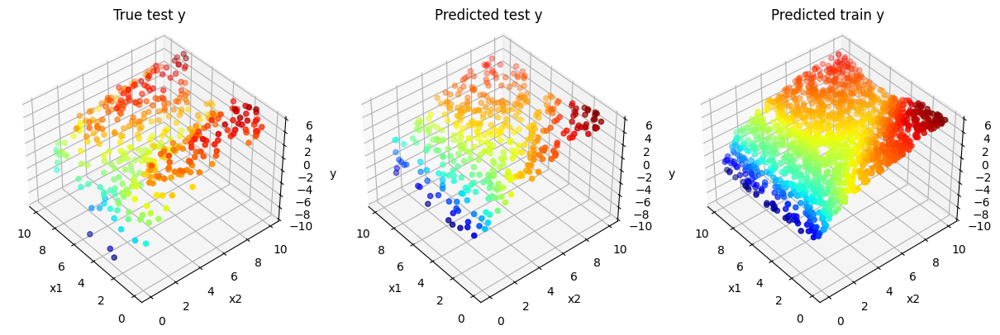

1800 tensor(1.8684, grad_fn=<MseLossBackward0>)
tensor(1.7213, grad_fn=<MseLossBackward0>)
tensor(1.7210, grad_fn=<MseLossBackward0>)
tensor(1.7206, grad_fn=<MseLossBackward0>)
tensor(1.7203, grad_fn=<MseLossBackward0>)
tensor(1.7200, grad_fn=<MseLossBackward0>)
tensor(1.7196, grad_fn=<MseLossBackward0>)
tensor(1.7193, grad_fn=<MseLossBackward0>)
tensor(1.7190, grad_fn=<MseLossBackward0>)
tensor(1.7187, grad_fn=<MseLossBackward0>)
tensor(1.7183, grad_fn=<MseLossBackward0>)
tensor(1.7180, grad_fn=<MseLossBackward0>)
tensor(1.7177, grad_fn=<MseLossBackward0>)
tensor(1.7174, grad_fn=<MseLossBackward0>)
tensor(1.7170, grad_fn=<MseLossBackward0>)
tensor(1.7167, grad_fn=<MseLossBackward0>)
tensor(1.7164, grad_fn=<MseLossBackward0>)
tensor(1.7161, grad_fn=<MseLossBackward0>)
tensor(1.7157, grad_fn=<MseLossBackward0>)
tensor(1.7154, grad_fn=<MseLossBackward0>)
tensor(1.7151, grad_fn=<MseLossBackward0>)
tensor(1.7148, grad_fn=<MseLossBackward0>)
tensor(1.7144, grad_fn=<MseLossBackward0>)
tensor

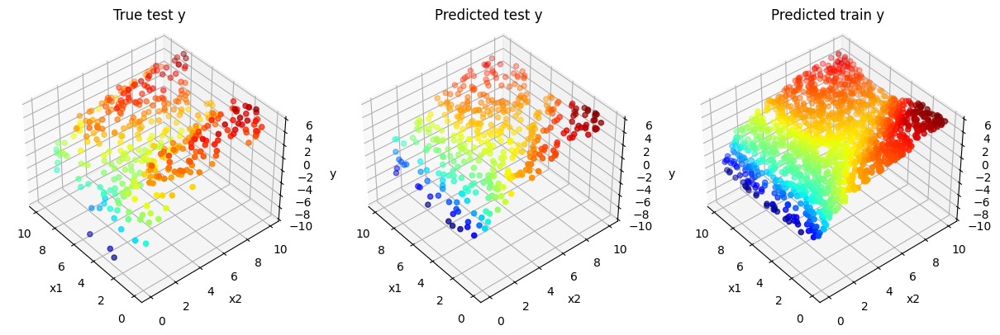

2000 tensor(1.7830, grad_fn=<MseLossBackward0>)
tensor(1.6521, grad_fn=<MseLossBackward0>)
tensor(1.6518, grad_fn=<MseLossBackward0>)
tensor(1.6514, grad_fn=<MseLossBackward0>)
tensor(1.6510, grad_fn=<MseLossBackward0>)
tensor(1.6506, grad_fn=<MseLossBackward0>)
tensor(1.6502, grad_fn=<MseLossBackward0>)
tensor(1.6499, grad_fn=<MseLossBackward0>)
tensor(1.6495, grad_fn=<MseLossBackward0>)
tensor(1.6491, grad_fn=<MseLossBackward0>)
tensor(1.6487, grad_fn=<MseLossBackward0>)
tensor(1.6484, grad_fn=<MseLossBackward0>)
tensor(1.6480, grad_fn=<MseLossBackward0>)
tensor(1.6476, grad_fn=<MseLossBackward0>)
tensor(1.6473, grad_fn=<MseLossBackward0>)
tensor(1.6469, grad_fn=<MseLossBackward0>)
tensor(1.6465, grad_fn=<MseLossBackward0>)
tensor(1.6461, grad_fn=<MseLossBackward0>)
tensor(1.6458, grad_fn=<MseLossBackward0>)
tensor(1.6454, grad_fn=<MseLossBackward0>)
tensor(1.6450, grad_fn=<MseLossBackward0>)
tensor(1.6447, grad_fn=<MseLossBackward0>)
tensor(1.6443, grad_fn=<MseLossBackward0>)
tensor

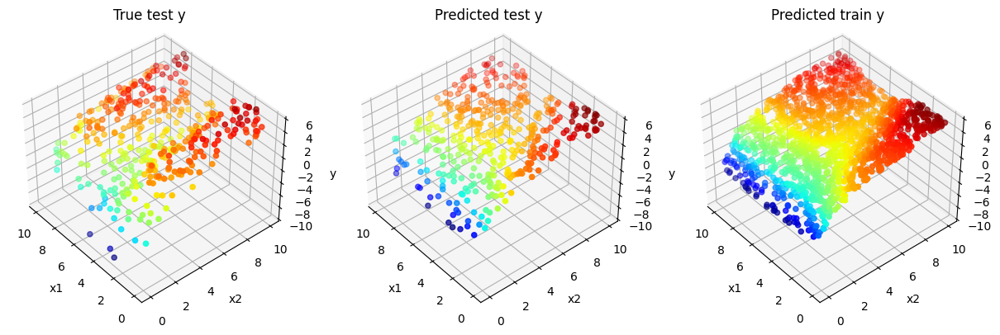

2200 tensor(1.6986, grad_fn=<MseLossBackward0>)
tensor(1.5745, grad_fn=<MseLossBackward0>)
tensor(1.5741, grad_fn=<MseLossBackward0>)
tensor(1.5738, grad_fn=<MseLossBackward0>)
tensor(1.5734, grad_fn=<MseLossBackward0>)
tensor(1.5730, grad_fn=<MseLossBackward0>)
tensor(1.5726, grad_fn=<MseLossBackward0>)
tensor(1.5722, grad_fn=<MseLossBackward0>)
tensor(1.5718, grad_fn=<MseLossBackward0>)
tensor(1.5715, grad_fn=<MseLossBackward0>)
tensor(1.5711, grad_fn=<MseLossBackward0>)
tensor(1.5707, grad_fn=<MseLossBackward0>)
tensor(1.5703, grad_fn=<MseLossBackward0>)
tensor(1.5699, grad_fn=<MseLossBackward0>)
tensor(1.5695, grad_fn=<MseLossBackward0>)
tensor(1.5692, grad_fn=<MseLossBackward0>)
tensor(1.5688, grad_fn=<MseLossBackward0>)
tensor(1.5684, grad_fn=<MseLossBackward0>)
tensor(1.5680, grad_fn=<MseLossBackward0>)
tensor(1.5676, grad_fn=<MseLossBackward0>)
tensor(1.5672, grad_fn=<MseLossBackward0>)
tensor(1.5669, grad_fn=<MseLossBackward0>)
tensor(1.5665, grad_fn=<MseLossBackward0>)
tensor

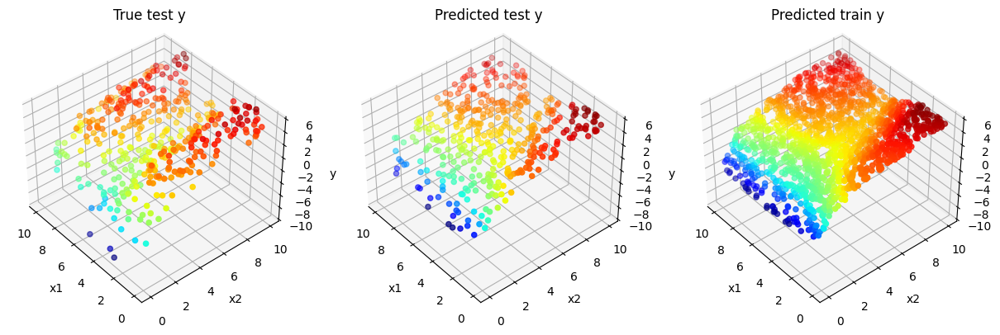

2400 tensor(1.6241, grad_fn=<MseLossBackward0>)
tensor(1.5020, grad_fn=<MseLossBackward0>)
tensor(1.5017, grad_fn=<MseLossBackward0>)
tensor(1.5014, grad_fn=<MseLossBackward0>)
tensor(1.5010, grad_fn=<MseLossBackward0>)
tensor(1.5007, grad_fn=<MseLossBackward0>)
tensor(1.5004, grad_fn=<MseLossBackward0>)
tensor(1.5000, grad_fn=<MseLossBackward0>)
tensor(1.4997, grad_fn=<MseLossBackward0>)
tensor(1.4994, grad_fn=<MseLossBackward0>)
tensor(1.4990, grad_fn=<MseLossBackward0>)
tensor(1.4987, grad_fn=<MseLossBackward0>)
tensor(1.4983, grad_fn=<MseLossBackward0>)
tensor(1.4980, grad_fn=<MseLossBackward0>)
tensor(1.4977, grad_fn=<MseLossBackward0>)
tensor(1.4973, grad_fn=<MseLossBackward0>)
tensor(1.4969, grad_fn=<MseLossBackward0>)
tensor(1.4966, grad_fn=<MseLossBackward0>)
tensor(1.4962, grad_fn=<MseLossBackward0>)
tensor(1.4959, grad_fn=<MseLossBackward0>)
tensor(1.4955, grad_fn=<MseLossBackward0>)
tensor(1.4952, grad_fn=<MseLossBackward0>)
tensor(1.4949, grad_fn=<MseLossBackward0>)
tensor

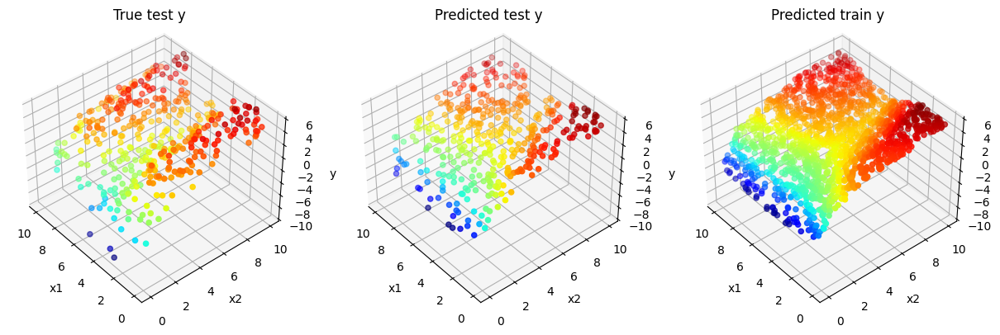

2600 tensor(1.5712, grad_fn=<MseLossBackward0>)
tensor(1.4468, grad_fn=<MseLossBackward0>)
tensor(1.4466, grad_fn=<MseLossBackward0>)
tensor(1.4464, grad_fn=<MseLossBackward0>)
tensor(1.4461, grad_fn=<MseLossBackward0>)
tensor(1.4459, grad_fn=<MseLossBackward0>)
tensor(1.4457, grad_fn=<MseLossBackward0>)
tensor(1.4454, grad_fn=<MseLossBackward0>)
tensor(1.4452, grad_fn=<MseLossBackward0>)
tensor(1.4450, grad_fn=<MseLossBackward0>)
tensor(1.4448, grad_fn=<MseLossBackward0>)
tensor(1.4445, grad_fn=<MseLossBackward0>)
tensor(1.4443, grad_fn=<MseLossBackward0>)
tensor(1.4441, grad_fn=<MseLossBackward0>)
tensor(1.4438, grad_fn=<MseLossBackward0>)
tensor(1.4436, grad_fn=<MseLossBackward0>)
tensor(1.4434, grad_fn=<MseLossBackward0>)
tensor(1.4431, grad_fn=<MseLossBackward0>)
tensor(1.4429, grad_fn=<MseLossBackward0>)
tensor(1.4427, grad_fn=<MseLossBackward0>)
tensor(1.4425, grad_fn=<MseLossBackward0>)
tensor(1.4422, grad_fn=<MseLossBackward0>)
tensor(1.4420, grad_fn=<MseLossBackward0>)
tensor

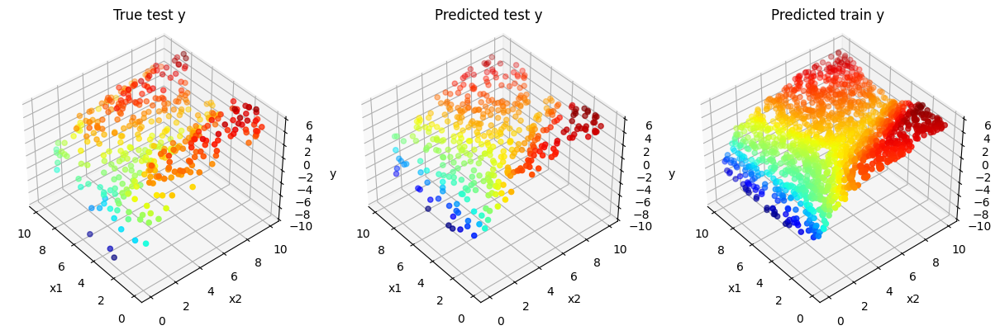

2800 tensor(1.5290, grad_fn=<MseLossBackward0>)
tensor(1.4049, grad_fn=<MseLossBackward0>)
tensor(1.4047, grad_fn=<MseLossBackward0>)
tensor(1.4045, grad_fn=<MseLossBackward0>)
tensor(1.4044, grad_fn=<MseLossBackward0>)
tensor(1.4042, grad_fn=<MseLossBackward0>)
tensor(1.4040, grad_fn=<MseLossBackward0>)
tensor(1.4038, grad_fn=<MseLossBackward0>)
tensor(1.4036, grad_fn=<MseLossBackward0>)
tensor(1.4034, grad_fn=<MseLossBackward0>)
tensor(1.4032, grad_fn=<MseLossBackward0>)
tensor(1.4030, grad_fn=<MseLossBackward0>)
tensor(1.4029, grad_fn=<MseLossBackward0>)
tensor(1.4027, grad_fn=<MseLossBackward0>)
tensor(1.4025, grad_fn=<MseLossBackward0>)
tensor(1.4023, grad_fn=<MseLossBackward0>)
tensor(1.4021, grad_fn=<MseLossBackward0>)
tensor(1.4019, grad_fn=<MseLossBackward0>)
tensor(1.4017, grad_fn=<MseLossBackward0>)
tensor(1.4015, grad_fn=<MseLossBackward0>)
tensor(1.4014, grad_fn=<MseLossBackward0>)
tensor(1.4012, grad_fn=<MseLossBackward0>)
tensor(1.4010, grad_fn=<MseLossBackward0>)
tensor

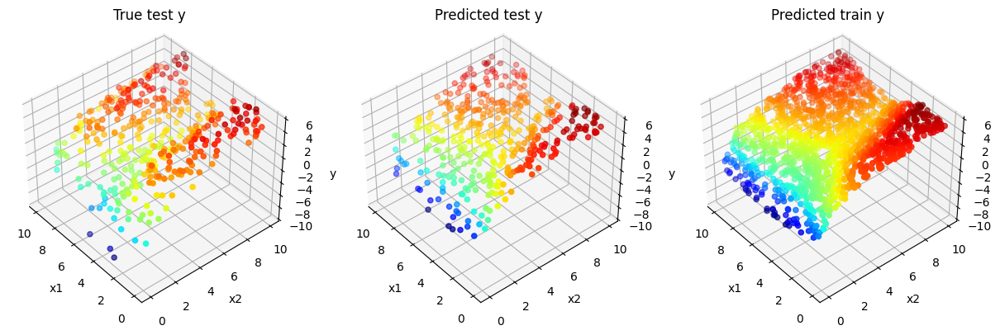

3000 tensor(1.4940, grad_fn=<MseLossBackward0>)
tensor(1.3699, grad_fn=<MseLossBackward0>)
tensor(1.3698, grad_fn=<MseLossBackward0>)
tensor(1.3696, grad_fn=<MseLossBackward0>)
tensor(1.3694, grad_fn=<MseLossBackward0>)
tensor(1.3693, grad_fn=<MseLossBackward0>)
tensor(1.3691, grad_fn=<MseLossBackward0>)
tensor(1.3690, grad_fn=<MseLossBackward0>)
tensor(1.3688, grad_fn=<MseLossBackward0>)
tensor(1.3686, grad_fn=<MseLossBackward0>)
tensor(1.3685, grad_fn=<MseLossBackward0>)
tensor(1.3683, grad_fn=<MseLossBackward0>)
tensor(1.3681, grad_fn=<MseLossBackward0>)
tensor(1.3680, grad_fn=<MseLossBackward0>)
tensor(1.3678, grad_fn=<MseLossBackward0>)
tensor(1.3677, grad_fn=<MseLossBackward0>)
tensor(1.3675, grad_fn=<MseLossBackward0>)
tensor(1.3673, grad_fn=<MseLossBackward0>)
tensor(1.3672, grad_fn=<MseLossBackward0>)
tensor(1.3670, grad_fn=<MseLossBackward0>)
tensor(1.3668, grad_fn=<MseLossBackward0>)
tensor(1.3667, grad_fn=<MseLossBackward0>)
tensor(1.3665, grad_fn=<MseLossBackward0>)
tensor

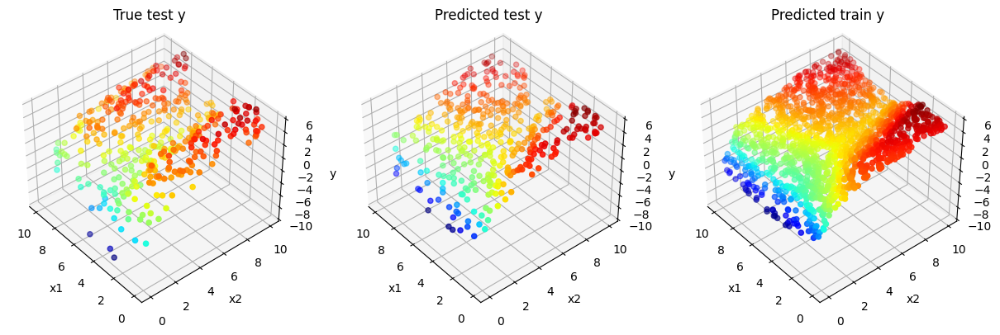

3200 tensor(1.4614, grad_fn=<MseLossBackward0>)
tensor(1.3361, grad_fn=<MseLossBackward0>)
tensor(1.3359, grad_fn=<MseLossBackward0>)
tensor(1.3357, grad_fn=<MseLossBackward0>)
tensor(1.3356, grad_fn=<MseLossBackward0>)
tensor(1.3354, grad_fn=<MseLossBackward0>)
tensor(1.3352, grad_fn=<MseLossBackward0>)
tensor(1.3350, grad_fn=<MseLossBackward0>)
tensor(1.3348, grad_fn=<MseLossBackward0>)
tensor(1.3346, grad_fn=<MseLossBackward0>)
tensor(1.3344, grad_fn=<MseLossBackward0>)
tensor(1.3342, grad_fn=<MseLossBackward0>)
tensor(1.3341, grad_fn=<MseLossBackward0>)
tensor(1.3339, grad_fn=<MseLossBackward0>)
tensor(1.3337, grad_fn=<MseLossBackward0>)
tensor(1.3335, grad_fn=<MseLossBackward0>)
tensor(1.3333, grad_fn=<MseLossBackward0>)
tensor(1.3331, grad_fn=<MseLossBackward0>)
tensor(1.3329, grad_fn=<MseLossBackward0>)
tensor(1.3327, grad_fn=<MseLossBackward0>)
tensor(1.3325, grad_fn=<MseLossBackward0>)
tensor(1.3323, grad_fn=<MseLossBackward0>)
tensor(1.3321, grad_fn=<MseLossBackward0>)
tensor

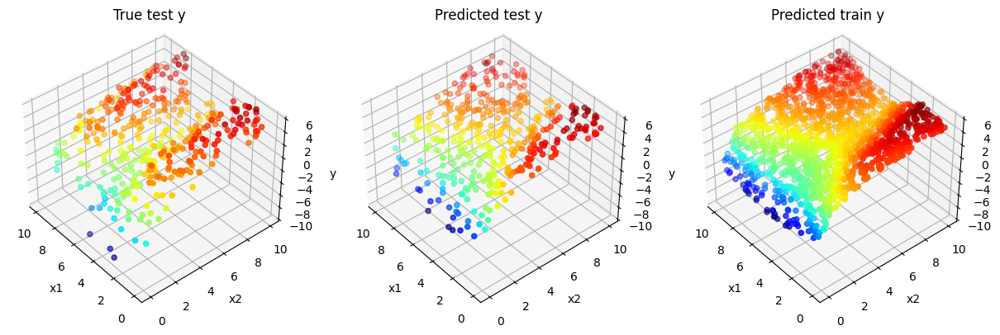

3400 tensor(1.4200, grad_fn=<MseLossBackward0>)
tensor(1.2976, grad_fn=<MseLossBackward0>)
tensor(1.2974, grad_fn=<MseLossBackward0>)
tensor(1.2973, grad_fn=<MseLossBackward0>)
tensor(1.2971, grad_fn=<MseLossBackward0>)
tensor(1.2969, grad_fn=<MseLossBackward0>)
tensor(1.2967, grad_fn=<MseLossBackward0>)
tensor(1.2965, grad_fn=<MseLossBackward0>)
tensor(1.2963, grad_fn=<MseLossBackward0>)
tensor(1.2961, grad_fn=<MseLossBackward0>)
tensor(1.2960, grad_fn=<MseLossBackward0>)
tensor(1.2958, grad_fn=<MseLossBackward0>)
tensor(1.2956, grad_fn=<MseLossBackward0>)
tensor(1.2954, grad_fn=<MseLossBackward0>)
tensor(1.2952, grad_fn=<MseLossBackward0>)
tensor(1.2950, grad_fn=<MseLossBackward0>)
tensor(1.2949, grad_fn=<MseLossBackward0>)
tensor(1.2947, grad_fn=<MseLossBackward0>)
tensor(1.2945, grad_fn=<MseLossBackward0>)
tensor(1.2943, grad_fn=<MseLossBackward0>)
tensor(1.2942, grad_fn=<MseLossBackward0>)
tensor(1.2940, grad_fn=<MseLossBackward0>)
tensor(1.2938, grad_fn=<MseLossBackward0>)
tensor

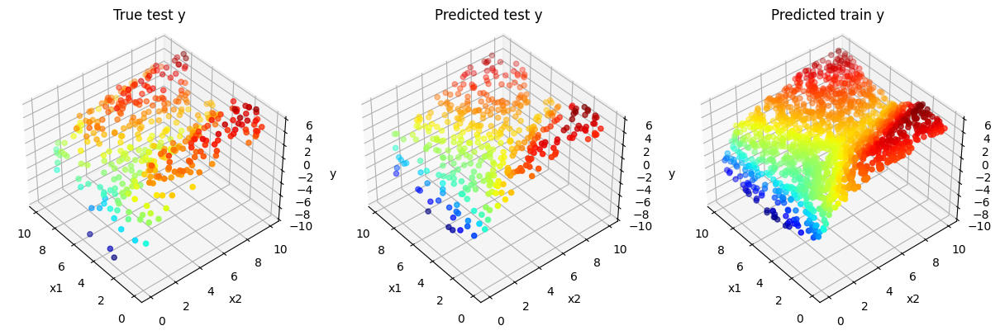

3600 tensor(1.3890, grad_fn=<MseLossBackward0>)
tensor(1.2647, grad_fn=<MseLossBackward0>)
tensor(1.2646, grad_fn=<MseLossBackward0>)
tensor(1.2645, grad_fn=<MseLossBackward0>)
tensor(1.2643, grad_fn=<MseLossBackward0>)
tensor(1.2642, grad_fn=<MseLossBackward0>)
tensor(1.2641, grad_fn=<MseLossBackward0>)
tensor(1.2639, grad_fn=<MseLossBackward0>)
tensor(1.2638, grad_fn=<MseLossBackward0>)
tensor(1.2637, grad_fn=<MseLossBackward0>)
tensor(1.2635, grad_fn=<MseLossBackward0>)
tensor(1.2634, grad_fn=<MseLossBackward0>)
tensor(1.2633, grad_fn=<MseLossBackward0>)
tensor(1.2631, grad_fn=<MseLossBackward0>)
tensor(1.2630, grad_fn=<MseLossBackward0>)
tensor(1.2628, grad_fn=<MseLossBackward0>)
tensor(1.2627, grad_fn=<MseLossBackward0>)
tensor(1.2626, grad_fn=<MseLossBackward0>)
tensor(1.2624, grad_fn=<MseLossBackward0>)
tensor(1.2623, grad_fn=<MseLossBackward0>)
tensor(1.2622, grad_fn=<MseLossBackward0>)
tensor(1.2620, grad_fn=<MseLossBackward0>)
tensor(1.2619, grad_fn=<MseLossBackward0>)
tensor

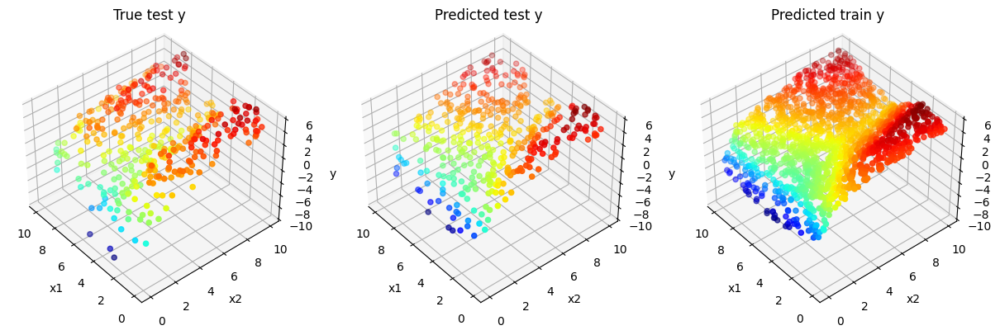

3800 tensor(1.3617, grad_fn=<MseLossBackward0>)
tensor(1.2394, grad_fn=<MseLossBackward0>)
tensor(1.2393, grad_fn=<MseLossBackward0>)
tensor(1.2392, grad_fn=<MseLossBackward0>)
tensor(1.2390, grad_fn=<MseLossBackward0>)
tensor(1.2389, grad_fn=<MseLossBackward0>)
tensor(1.2388, grad_fn=<MseLossBackward0>)
tensor(1.2387, grad_fn=<MseLossBackward0>)
tensor(1.2386, grad_fn=<MseLossBackward0>)
tensor(1.2384, grad_fn=<MseLossBackward0>)
tensor(1.2383, grad_fn=<MseLossBackward0>)
tensor(1.2382, grad_fn=<MseLossBackward0>)
tensor(1.2381, grad_fn=<MseLossBackward0>)
tensor(1.2380, grad_fn=<MseLossBackward0>)
tensor(1.2379, grad_fn=<MseLossBackward0>)
tensor(1.2377, grad_fn=<MseLossBackward0>)
tensor(1.2376, grad_fn=<MseLossBackward0>)
tensor(1.2375, grad_fn=<MseLossBackward0>)
tensor(1.2374, grad_fn=<MseLossBackward0>)
tensor(1.2373, grad_fn=<MseLossBackward0>)
tensor(1.2371, grad_fn=<MseLossBackward0>)
tensor(1.2370, grad_fn=<MseLossBackward0>)
tensor(1.2369, grad_fn=<MseLossBackward0>)
tensor

In [15]:
import torch.optim as optim
from sklearn.metrics import mean_absolute_error


# ====== Construct Model ====== #
# model = LinearModel()
# print(model.linear.weight)
# print(model.linear.bias)

model = MLPModel(2,1,200) # Model을 생성해줍니다.
#print('{} parameters'.format(sum(p.numel() for p in model.parameters() if p.requires_grad))) # 복잡해보이지만 간단히 모델 내에 학습을 당할 파라미터 수를 카운팅하는 코드입니다.

# ===== Construct Optimizer ====== #
lr = 0.005 # Learning Rate를 하나 정해줍니다. (원할한 학습을 위해 손을 많이 탑니다)
optimizer = optim.SGD(model.parameters(), lr=lr) # Optimizer를 생성해줍니다.model.parameters()로 w와 b를 optimizer에게 전달 

#print(model.parameters())
#SGD : Stochastic Gradient Descent
#adam , rmsprop , adadelta etc

# 매 학습 단계에서의 epoch값과 그 때의 loss 값을 저장할 리스트를 만들어줍시다.
list_epoch = [] 
list_train_loss = []
list_val_loss = []
list_mae = []
list_mae_epoch = []


epoch = 4000 # 학습 횟수(epoch)을 지정해줍시다. 
#iteration과 혼동 X iteration : parameter가 한번 업데이트 되는 것을 말함
#만약 data가 10만개 만개 씩 chunk 하면(chunk를 batch 혹은 mini batch 라고함) batch 한번으로 gradient를 업데이트하는데 이때 1 iteration 한 것 이때 각 batch를 모두 수행하면 즉 10 iteration을 하면 이게 1 epoch

for i in range(epoch):
    
    # ====== Train ====== #
    model.train() # model을 train 모드로 세팅합니다. 반대로 향후 모델을 평가할 때는 eval() 모드로 변경할 겁니다 (나중 실습에서 쓸 겁니다)
    optimizer.zero_grad() # optimizer에 남아있을 수도 있는 잔여 그라디언트를 0으로 다 초기화해줍니다. 반복문 상 한번 train할 때 남은 gradient가 중첩하는 것을 방지
    
    #train_X 와 train_Y는 각각 numpy로 이를 tensor로 바꿔줌
    input_x = torch.Tensor(train_X)
    true_y = torch.Tensor(train_y)
    pred_y = model(input_x)
    #print(input_x.shape, true_y.shape, pred_y.shape) # 각 인풋과 아웃풋의 차원을 체크해봅니다.
    

    #print(pred_y.shape,pred_y.squeeze().shape)
    loss = reg_loss(pred_y.squeeze(), true_y) #pred_y의 shape은 1600 X 1 즉 2차원으로 되어있음 loss는 1600을 원하기 때문에 2차원을 1차원리스트로 바꿈
    print(loss)

    loss.backward() # backward()를 통해서 그라디언트를 구해줍니다.
    optimizer.step() # step()을 통해서 그라디언트를 바탕으로 파라미터를 업데이트 해줍니다. 
    list_epoch.append(i)
    #list_train_loss.append(loss.detach().numpy()) #위에 loss에 backward를 해줬기 때문에 gradient가 loss에 존재하기때문에 gradient를 제외하고 loss만 출력하고자 detach() 사용 , 해당 type이 tensor 이기 때문에 numpy() 로 바꿈
    list_train_loss.append(loss.item()) #loss.item하면 위 말한 과정이 한번에

    
    
    # ====== Validation ====== #
    model.eval() #evaluation 모드로 바꿔줌
    optimizer.zero_grad()
    input_x = torch.Tensor(val_X)
    true_y = torch.Tensor(val_y)
    pred_y = model(input_x)   
    loss = reg_loss(pred_y.squeeze(), true_y)
    list_val_loss.append(loss.detach().numpy())
    

    # ====== Evaluation ======= #
    if i % 200 == 0: # 200회의 학습마다 실제 데이터 분포와 모델이 예측한 분포를 그려봅니다.
        
        # ====== Calculate MAE ====== #
        model.eval()
        optimizer.zero_grad()
        input_x = torch.Tensor(test_X)
        true_y = torch.Tensor(test_y)
        pred_y = model(input_x).detach().numpy() 
        mae = mean_absolute_error(true_y, pred_y) # sklearn 쪽 함수들은 true_y 가 먼저, pred_y가 나중에 인자로 들어가는 것에 주의합시다
        list_mae.append(mae)
        list_mae_epoch.append(i)
        
        fig = plt.figure(figsize=(15,5))
        
        # ====== True Y Scattering ====== #
        ax1 = fig.add_subplot(1, 3, 1, projection='3d')
        ax1.scatter(test_X[:, 0], test_X[:, 1], test_y, c=test_y, cmap='jet')
        
        ax1.set_xlabel('x1')
        ax1.set_ylabel('x2')
        ax1.set_zlabel('y')
        ax1.set_zlim(-10, 6)
        ax1.view_init(40, -40)
        ax1.set_title('True test y')
        ax1.invert_xaxis()

        # ====== Predicted Y Scattering ====== #
        ax2 = fig.add_subplot(1, 3, 2, projection='3d')
        ax2.scatter(test_X[:, 0], test_X[:, 1], pred_y, c=pred_y[:,0], cmap='jet')

        ax2.set_xlabel('x1')
        ax2.set_ylabel('x2')
        ax2.set_zlabel('y')
        ax2.set_zlim(-10, 6)
        ax2.view_init(40, -40)
        ax2.set_title('Predicted test y')
        ax2.invert_xaxis()

        # ====== Just for Visualizaing with High Resolution ====== #
        input_x = torch.Tensor(train_X)
        pred_y = model(input_x).detach().numpy() 
        
        ax3 = fig.add_subplot(1, 3, 3, projection='3d')
        ax3.scatter(train_X[:, 0], train_X[:, 1], pred_y, c=pred_y[:,0], cmap='jet')

        ax3.set_xlabel('x1')
        ax3.set_ylabel('x2')
        ax3.set_zlabel('y')
        ax3.set_zlim(-10, 6)
        ax3.view_init(40, -40)
        ax3.set_title('Predicted train y')
        ax3.invert_xaxis()
        
        plt.show()
        print(i, loss)

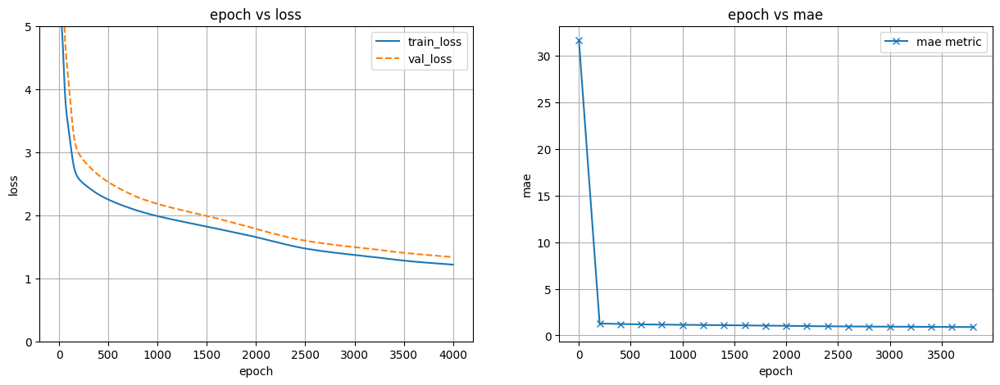

In [16]:
#loss를 저장해서 해당 과정이 어떻게 진행했는지 확인하는 절차 꼭해줘야함!!!


fig = plt.figure(figsize=(15,5))

# ====== Loss Fluctuation ====== #
ax1 = fig.add_subplot(1, 2, 1)
ax1.plot(list_epoch, list_train_loss, label='train_loss')
ax1.plot(list_epoch, list_val_loss, '--', label='val_loss')
ax1.set_xlabel('epoch')
ax1.set_ylabel('loss')
ax1.set_ylim(0, 5)
ax1.grid()
ax1.legend()
ax1.set_title('epoch vs loss')

# ====== Metric Fluctuation ====== #
ax2 = fig.add_subplot(1, 2, 2)
ax2.plot(list_mae_epoch, list_mae, marker='x', label='mae metric')

ax2.set_xlabel('epoch')
ax2.set_ylabel('mae')
ax2.grid()
ax2.legend()
ax2.set_title('epoch vs mae')


plt.show()